In [1]:
# ! pip install pymilvus==2.3.1

In [2]:
from dotenv import load_dotenv
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.utils import load_img, save_img, img_to_array
from tensorflow.keras.applications.vgg19 import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D
from pymilvus import connections, Collection, utility

### Vectorization using VGG19 model fine tuned on vegetable images

In [3]:
class ImageVectorizer:
    '''
    Get vector representation of an image using VGG19 model fine tuned on vegetable images for classification
    '''
    
    def __init__(self):
        self.__model = self.get_model()
    
    @staticmethod
    def get_model():
        model = load_model('vegetable_classification_model_vgg.h5') # loading saved VGG model finetuned on vegetable images for classification
        top = model.get_layer('block5_pool').output
        top = GlobalAveragePooling2D()(top)
        model = Model(inputs=model.input, outputs=top)
        return model
    
    def vectorize(self, img_path: str):
        model = self.__model
        test_image = load_img(img_path, color_mode="rgb", target_size=(224, 224))
        test_image = img_to_array(test_image)
        test_image = preprocess_input(test_image)
        test_image = np.array([test_image])
        return model(test_image).numpy()[0]

In [4]:
vectorizer = ImageVectorizer()

In [5]:
# Reading milvus URI & API token From secrets.env
load_dotenv('secrets.env')
uri = os.environ.get("URI")
token = os.environ.get("TOKEN")

In [6]:
# connecting to db
connections.connect("default", uri=uri, token=token)
print(f"Connected to DB")

Connected to DB


In [7]:
collection_name = os.environ.get("COLLECTION_NAME")
check_collection = utility.has_collection(collection_name)
check_collection # checks if collection exists

True

In [8]:
# load the collection before querying
collection = Collection(name=collection_name)
collection.load()

In [9]:
def plot_images(input_image_path: str, similar_img_paths: list):
    # plotting input image
    input_image = load_img(input_image_path, color_mode="rgb", target_size=(224, 224))
    plt.imshow(input_image)
    plt.axis("off")
    plt.title("Input Image")
    
    # plotting similar images
    cols = len(similar_img_paths)
    fig, ax = plt.subplots(1, cols, figsize=(12,45))
    for i in range(cols):
        sim_image = load_img(similar_img_paths[i], color_mode="rgb", target_size=(224, 224))
        ax[i].imshow(sim_image)
        ax[i].axis("off")
        ax[i].set_title(f"Similar Image {i+1}")
    
    plt.show()

In [10]:
def find_similar_images(img_path: str, top_n: int=5):
    search_params = {"metric_type": "L2"}
    search_vec = vectorizer.vectorize(img_path)
    result = collection.search([search_vec],
                                anns_field='image_vector', # annotation field specified in the schema definition
                                param=search_params,
                                limit=top_n,
                                guarantee_timestamp=1, 
                                output_fields=['image_path']) # which fields to return in output
    
    output_dict = {"input_image_path": img_path, "similar_image_paths": [hit.entity.get('image_path') for hits in result for hit in hits]} 
    plot_images(output_dict['input_image_path'], output_dict['similar_image_paths'])
    return output_dict

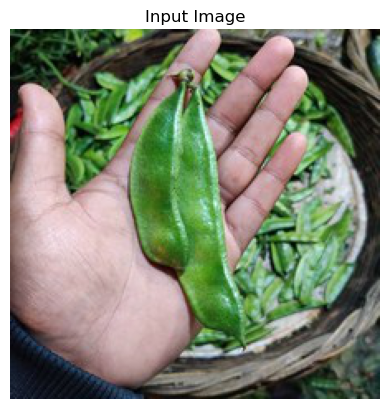

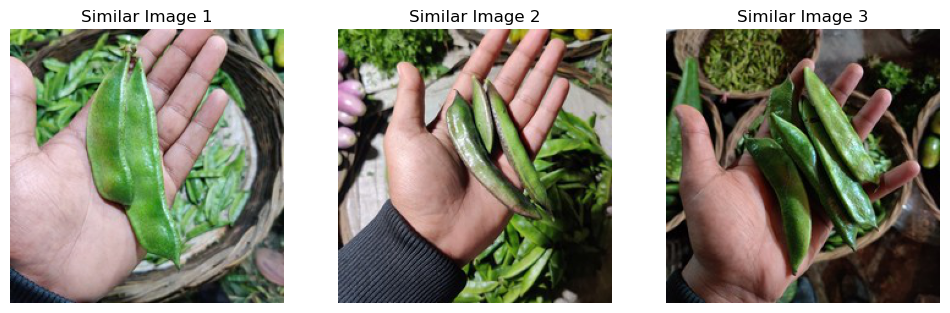

In [11]:
image_path = "Vegetable Images/validation/Bean/0478.jpg"
_ = find_similar_images(image_path)

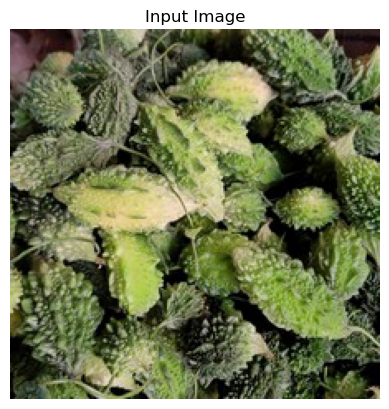

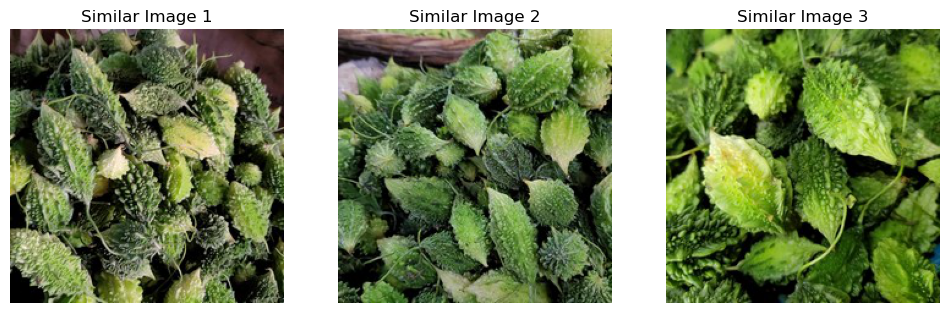

In [12]:
image_path = "Vegetable Images/validation/Bitter_Gourd/1039.jpg"
_ = find_similar_images(image_path)

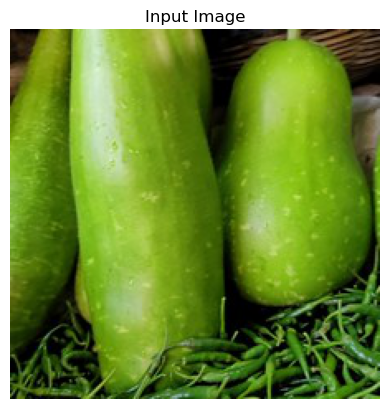

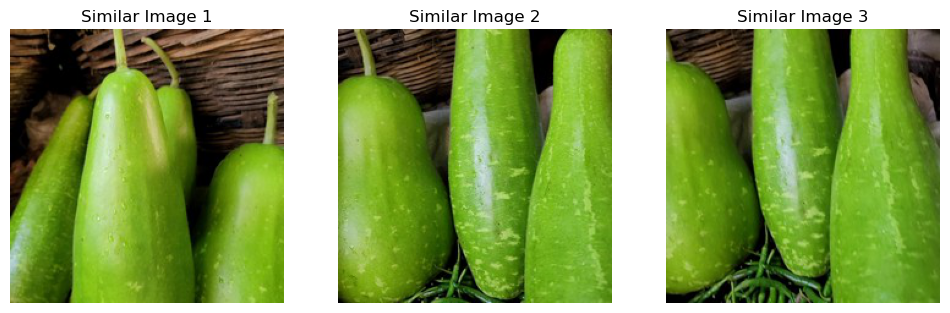

In [13]:
image_path = "Vegetable Images/validation/Bottle_Gourd/1255.jpg"
_ = find_similar_images(image_path)

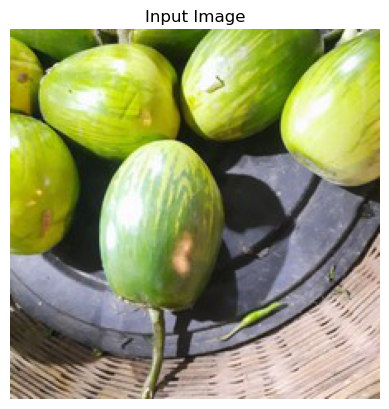

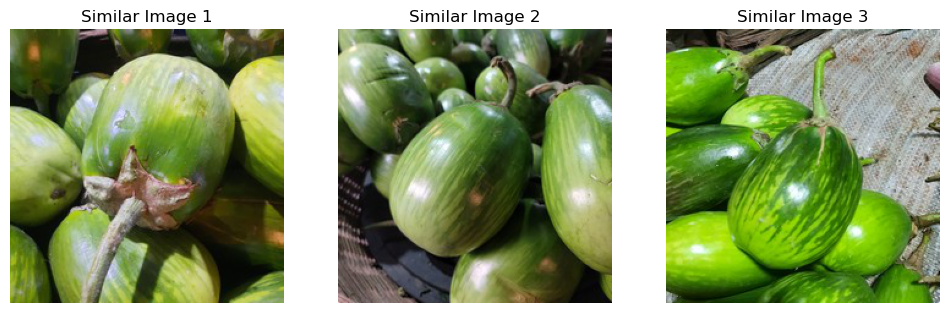

In [14]:
image_path = "Vegetable Images/validation/Brinjal/1209.jpg"
_ = find_similar_images(image_path)

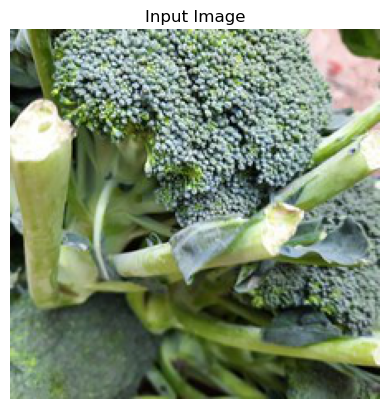

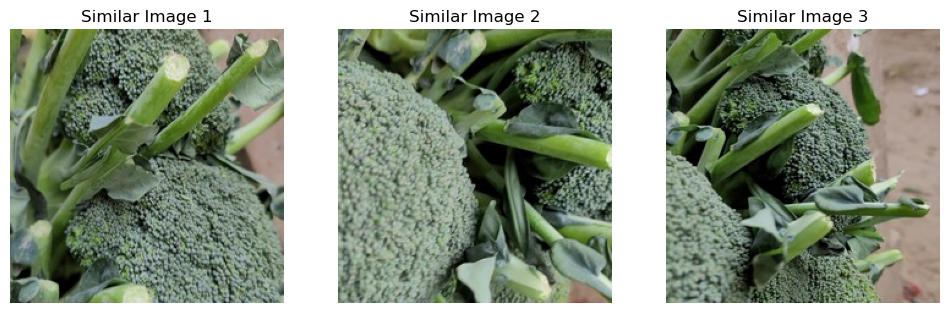

In [15]:
image_path = "Vegetable Images/validation/Broccoli/1270.jpg"
_ = find_similar_images(image_path)

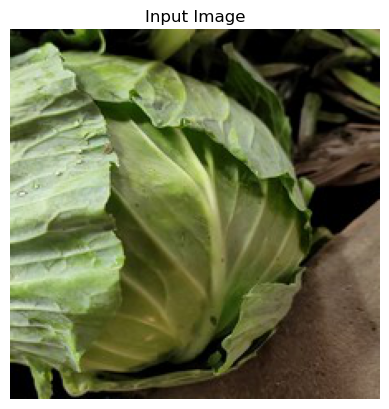

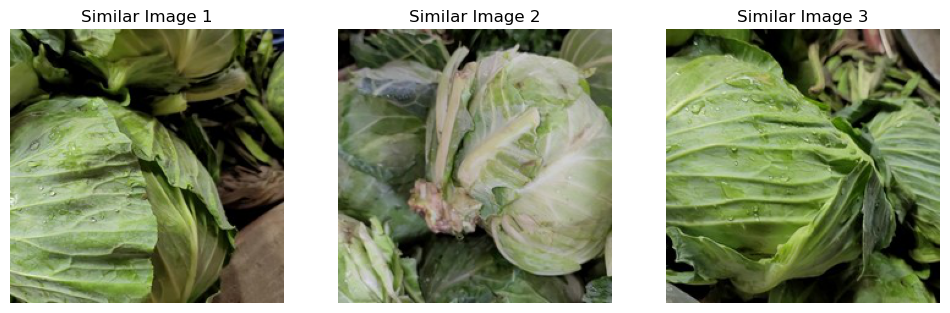

In [16]:
image_path = "Vegetable Images/validation/Cabbage/1229.jpg"
_ = find_similar_images(image_path)

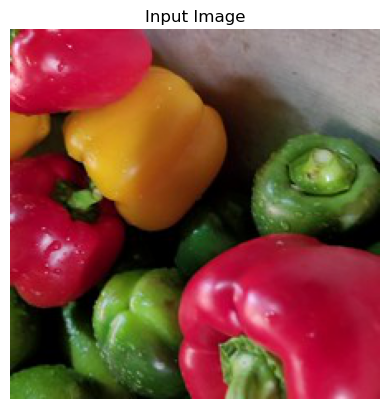

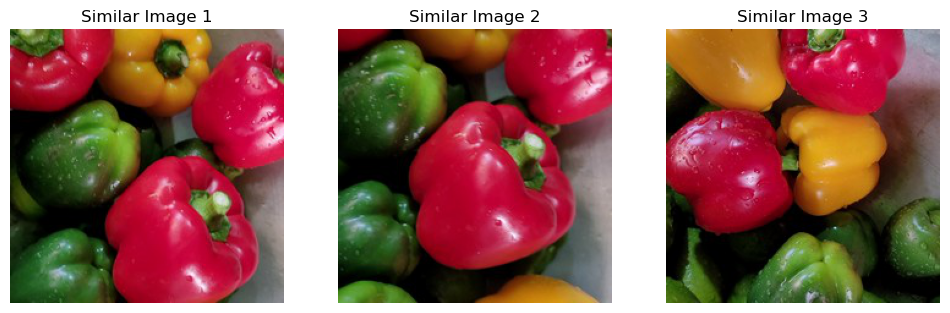

In [17]:
image_path = "Vegetable Images/validation/Capsicum/1230.jpg"
_ = find_similar_images(image_path)

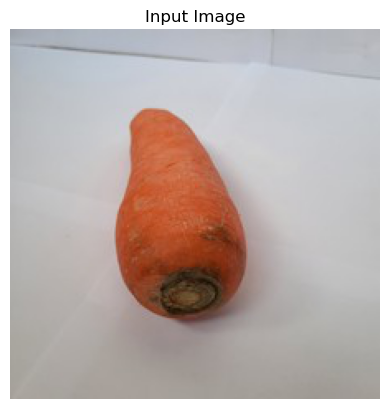

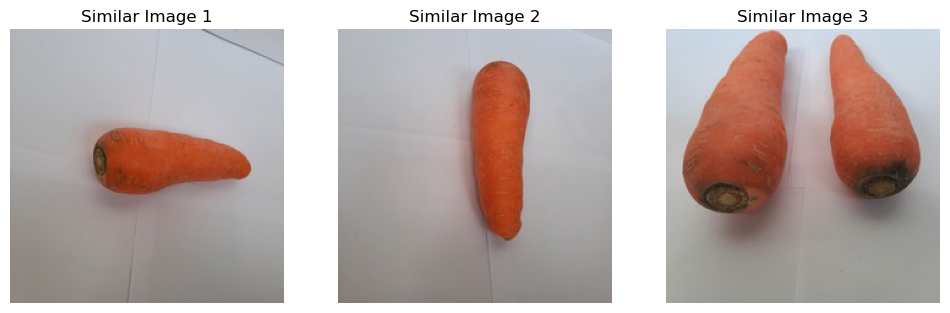

In [18]:
image_path = "Vegetable Images/validation/Carrot/1299.jpg"
_ = find_similar_images(image_path)

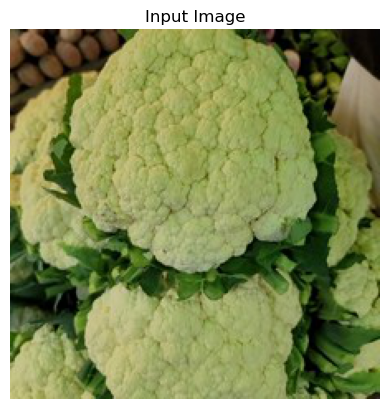

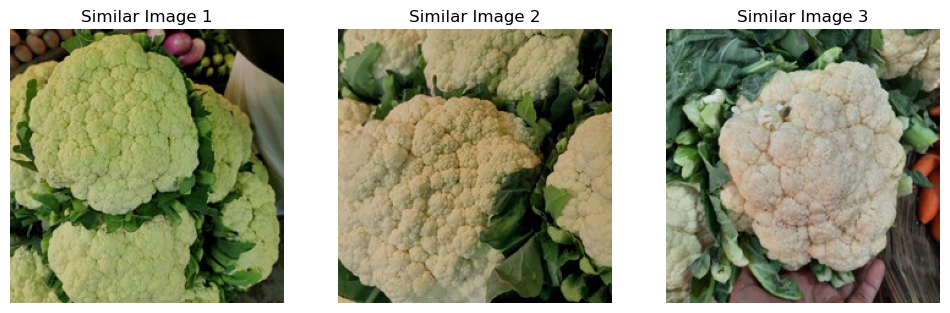

In [19]:
image_path = "Vegetable Images/validation/Cauliflower/1270.jpg"
_ = find_similar_images(image_path)

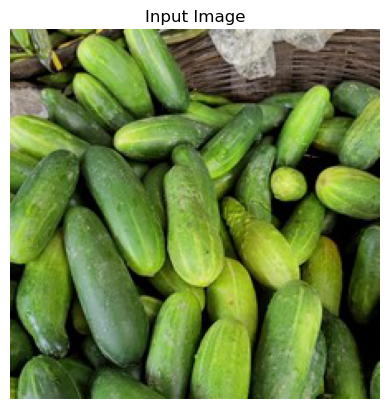

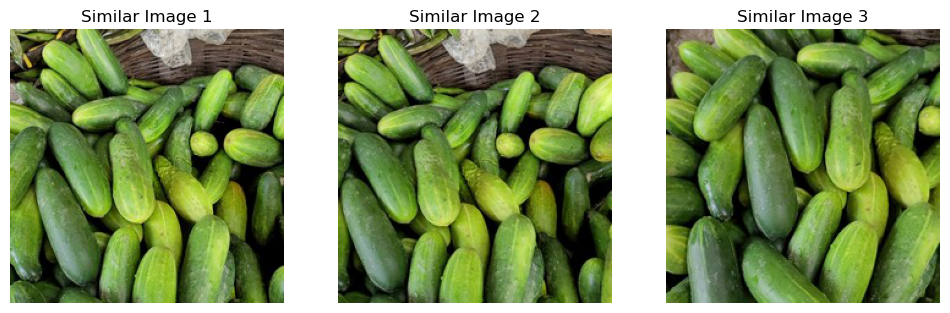

In [20]:
image_path = "Vegetable Images/validation/Cucumber/1291.jpg"
_ = find_similar_images(image_path)

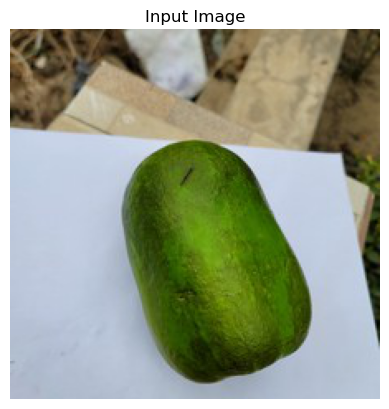

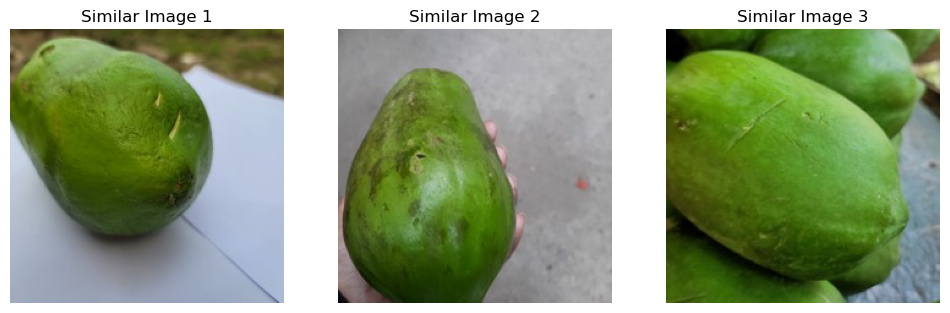

In [21]:
image_path = "Vegetable Images/validation/Papaya/1112.jpg"
_ = find_similar_images(image_path)

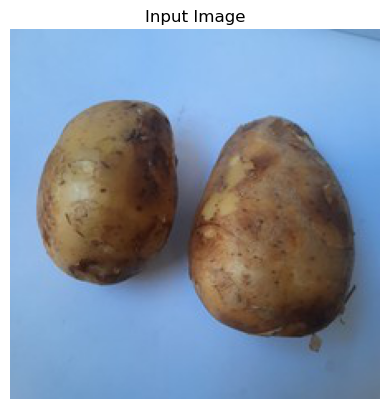

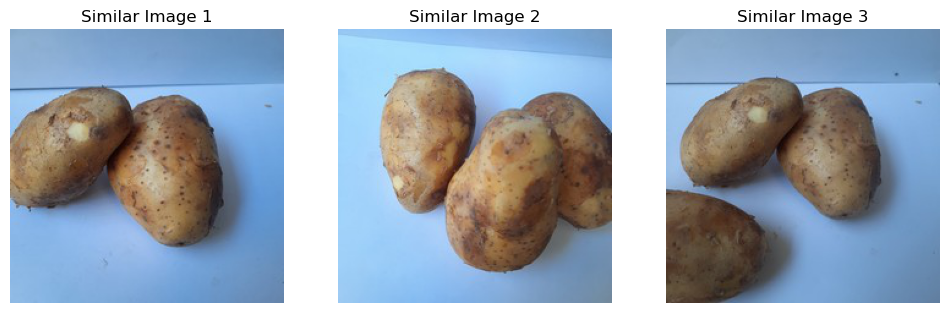

In [22]:
image_path = "Vegetable Images/validation/Potato/1210.jpg"
_ = find_similar_images(image_path)

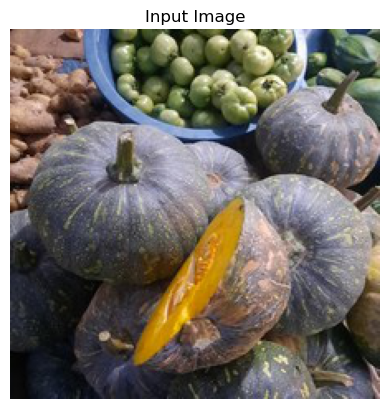

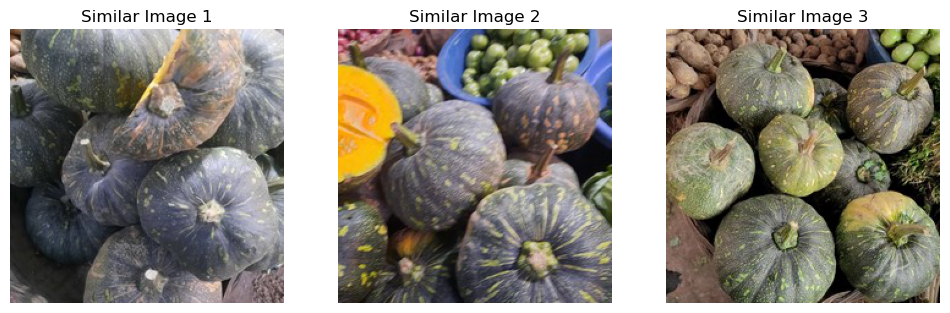

In [23]:
image_path = "Vegetable Images/validation/Pumpkin/1203.jpg"
_ = find_similar_images(image_path)

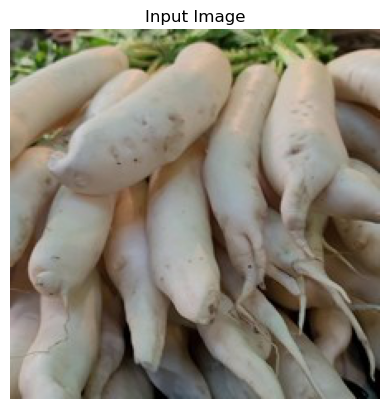

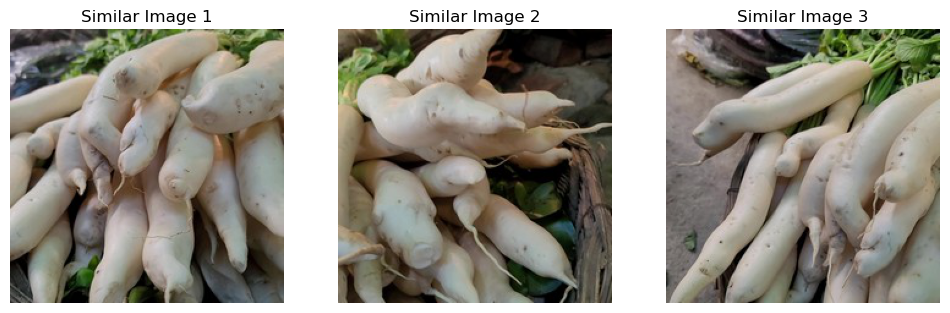

In [24]:
image_path = "Vegetable Images/validation/Radish/1215.jpg"
_ = find_similar_images(image_path)

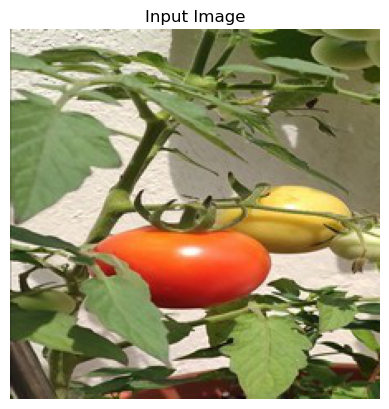

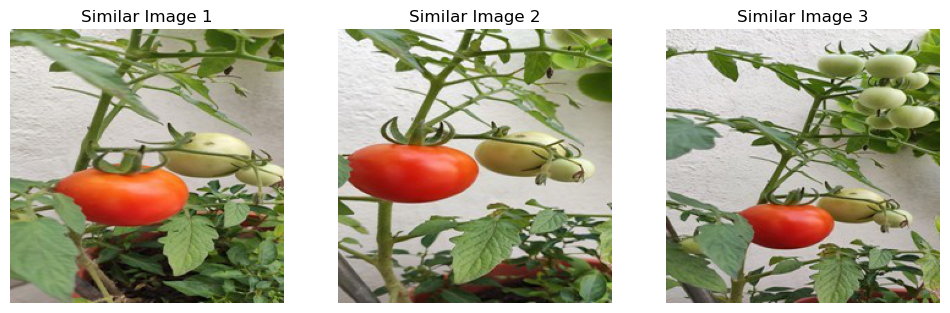

In [25]:
image_path = "Vegetable Images/validation/Tomato/1231.jpg"
_ = find_similar_images(image_path)